based on https://jhat.readthedocs.io/en/latest/examples/plot_b_nircam.html


# JWST NIRCAM

Aligning JWST/NIRCAM images with JHAT.


An example NIRCam Dataset is downloaded, and then a series of
alignment methods are used. For more information on the
key parameters used for alignment see 
`params:Useful Parameters`.

In [1]:
import sys,os,glob
import pandas as pd
from astropy.io import fits
from astropy.table import Table
from astropy.nddata import extract_array
from astropy.coordinates import SkyCoord
from astropy import wcs
from astropy.wcs.utils import skycoord_to_pixel
from astropy import units as u
from astropy.stats import sigma_clipped_stats
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from astroquery.mast import Observations
from astropy.visualization import (simple_norm,LinearStretch)
from astroquery.gaia import Gaia
from jwst.datamodels import ImageModel

from scipy.ndimage import binary_dilation
from copy import deepcopy

import jhat
from jhat import jwst_photclass,st_wcs_align

from nbutils import xmatch_common



The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    


## Relative Alignment

**Download some Data**

For this example we download 2 JWST NIRCam images from MAST. They're
the same field but different filters. Note that 
the code will also work for level 3 data images.



In [4]:
obs_table1 = Observations.query_criteria(obs_id='jw02107-o041_t019_nircam_clear-f200w')
data_products_by_obs = Observations.get_product_list(obs_table1)
data_products_by_obs = data_products_by_obs[data_products_by_obs['calib_level']==2]
data_products_by_obs = data_products_by_obs[data_products_by_obs['productSubGroupDescription']=='CAL']
data_products_by_obs = data_products_by_obs[data_products_by_obs['obs_id']=='jw02107041001_02101_00001_nrcb1']

In [18]:
data_products_by_obs

obsID,obs_collection,dataproduct_type,obs_id,description,type,dataURI,productType,productGroupDescription,productSubGroupDescription,productDocumentationURL,project,prvversion,proposal_id,productFilename,size,parent_obsid,dataRights,calib_level,filters
str8,str4,str5,str36,str64,str1,str68,str9,str28,str11,str1,str7,str6,str4,str50,int64,str8,str6,int64,str5
87617603,JWST,image,jw02107041001_02101_00001_nrcb1,exposure (L2b): 2D calibrated exposure average over integrations,S,mast:JWST/product/jw02107041001_02101_00001_nrcb1_cal.fits,SCIENCE,--,CAL,--,CALJWST,1.14.0,2107,jw02107041001_02101_00001_nrcb1_cal.fits,117538560,87623725,PUBLIC,2,F200W


In [19]:
Observations.download_products(data_products_by_obs,extension='fits')

Local Path,Status,Message,URL
str92,str8,object,object
./mastDownload/JWST/jw02107041001_02101_00001_nrcb1/jw02107041001_02101_00001_nrcb1_cal.fits,COMPLETE,None,None


In [20]:
obs_table2 = Observations.query_criteria(obs_id='jw02107-o041_t019_nircam_clear-f360m')
data_products_by_obs = Observations.get_product_list(obs_table2)
data_products_by_obs = data_products_by_obs[data_products_by_obs['calib_level']==2]
data_products_by_obs = data_products_by_obs[data_products_by_obs['productSubGroupDescription']=='CAL']
data_products_by_obs = data_products_by_obs[data_products_by_obs['obs_id']=='jw02107041001_02101_00001_nrcblong']

In [21]:
data_products_by_obs

obsID,obs_collection,dataproduct_type,obs_id,description,type,dataURI,productType,productGroupDescription,productSubGroupDescription,productDocumentationURL,project,prvversion,proposal_id,productFilename,size,parent_obsid,dataRights,calib_level,filters
str8,str4,str5,str36,str64,str1,str69,str9,str28,str11,str1,str7,str6,str4,str51,int64,str8,str6,int64,str5
87617252,JWST,image,jw02107041001_02101_00001_nrcblong,exposure (L2b): 2D calibrated exposure average over integrations,S,mast:JWST/product/jw02107041001_02101_00001_nrcblong_cal.fits,SCIENCE,--,CAL,--,CALJWST,1.14.0,2107,jw02107041001_02101_00001_nrcblong_cal.fits,117538560,87623738,PUBLIC,2,F360M


In [22]:
Observations.download_products(data_products_by_obs,extension='fits')

Local Path,Status,Message,URL
str98,str8,object,object
./mastDownload/JWST/jw02107041001_02101_00001_nrcblong/jw02107041001_02101_00001_nrcblong_cal.fits,COMPLETE,None,None


**Create a Photometric Catalog for Relative Alignment**

We choose one of the images to be the reference image, and then 
create a catalog that we will use to align the other image.



In [60]:
ref_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrca4_cal.fits')[0]

In [61]:
jwst_phot = jwst_photclass()
jwst_phot.run_phot(imagename=ref_image,photfilename='auto',overwrite=True,ee_radius=80,use_dq=True)
ref_catname = ref_image.replace('.fits','.phot.txt') # the default
refcat = Table.read(ref_catname,format='ascii')
print(refcat)

0 jwstred_temp_gaia/jw01334001001_02101_00002_nrca4_cal.phot.txt


2024-09-26 13:44:08,148 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-09-26 13:44:08,475 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /home/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-09-26 13:44:08,495 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /home/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-09-26 13:44:08,498 - stpipe - INFO - Instrument: NIRCAM
2024-09-26 13:44:08,499 - stpipe - INFO - Detector: NRCA4
2024-09-26 13:44:08,499 - stpipe - INFO - Filter: F090W
2024-09-26 13:44:08,500 - stpipe - INFO - Pupil: CLEAR
2024-09-26 13:44:08,502 - stpipe - INFO - Subarray: FULL
2024-09-26 13:44:08,551 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.36200000000000004
aper_sum_7.5px annulus_median_7.5px aper_bkg_7.5px ...   x_idl      y_idl   
-------------- -------------------- -------------- ... ---------- ----------
    217.391903              0.74648     131.211238 ... -26.505511 -31.343517
     161.09213             0.895343     157.377412 ...  -4.488737 -31.511663
   1348.122958             1.945721     342.005957 ...  10.300244 -31.600683
    434.170569             2.055243     361.257068 ...  11.095951 -31.573687
   2133.167646             4.606422     809.686251 ...  14.891911 -31.506553
    1683.51849             3.081981     541.730124 ...  20.102072 -31.548196
   1268.387746             4.799665     843.653313 ...  21.394131  -31.62952
    498.478451             2.399218     421.718556 ...  22.170991  -31.55809
   1791.849782               5.4892     964.855184 ...  28.871605 -31.576615
   1149.240204             1.090143     191.618141 ...   -28.9046 -31.336692
           ...                  ...            ... 

**Align the second image**

The plots outputted here show the various steps used by jhat to
determine the true matching sources in the image, and the
subsequent correction needed for optimal alignment.



In [63]:
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrca4_cal.fits')[0]
align_image = glob.glob('jwstred_temp_gaia/jw01334001001_04101_00001_nrca4_cal.fits')[0]

0 ./jwstred_temp_gaia/jw01334001001_04101_00001_nrca4.phot.txt
Using DQ extension!!


2024-09-26 13:46:45,446 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-09-26 13:46:45,806 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /home/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-09-26 13:46:45,821 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /home/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-09-26 13:46:45,823 - stpipe - INFO - Instrument: NIRCAM
2024-09-26 13:46:45,824 - stpipe - INFO - Detector: NRCA4
2024-09-26 13:46:45,825 - stpipe - INFO - Filter: F150W
2024-09-26 13:46:45,826 - stpipe - INFO - Pupil: CLEAR
2024-09-26 13:46:45,827 - stpipe - INFO - Subarray: FULL
2024-09-26 13:46:45,868 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.2172
dmag 0.1
sharpness 0.9
roundness1 0.7
mag 21
x 2008
y 2008
reffile_d2d 0.15
*** Note: close plot to continue!


<IPython.core.display.Javascript object>


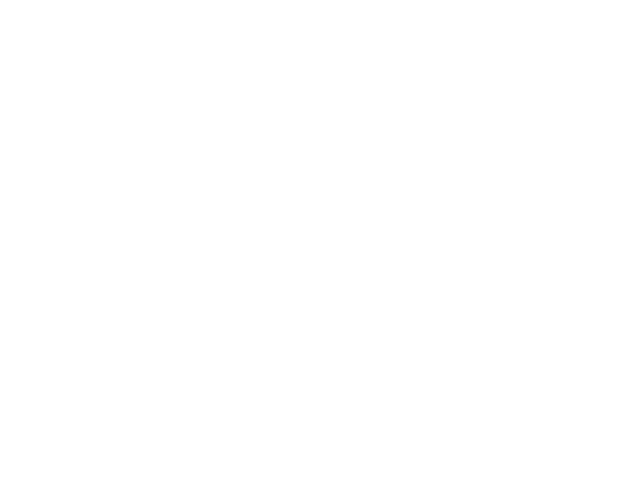

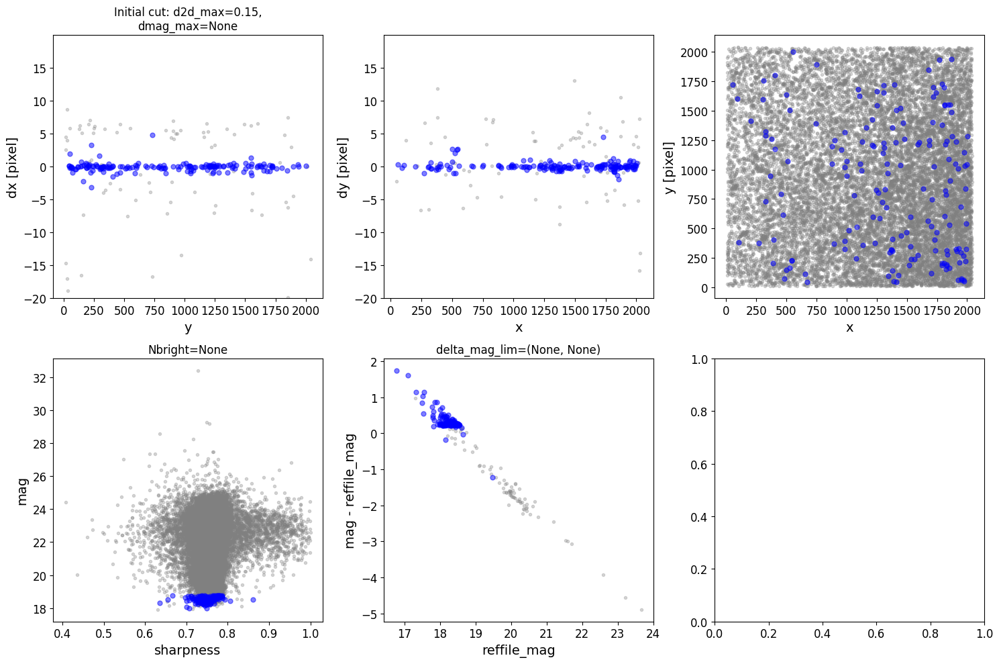

   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000391       -0.4   114.0      4    -0.050005   1.6     False
d_rot_tmp 0.7499946592293825
Keeping 145 out of 145, skippin 0 because of null values in columns d_rot_tmp
median: 0.036844
75.000000 percentile cut: max residual for cut: 0.355323
__tmp_residuals 0.3553232443509177
median: 0.054773
i:00 mean:0.054773(0.016732) stdev:0.173073(0.011776) X2norm:1.00 Nchanged:0 Ngood:108 Nclip:37

mean: 0.059996
i:01 mean:0.059996(0.020174) stdev:0.227352(0.014209) X2norm:1.00 Nchanged:20 Ngood:128 Nclip:17

mean: 0.059804
i:02 mean:0.059804(0.023153) stdev:0.270997(0.016312) X2norm:1.00 Nchanged:10 Ngood:138 Nclip:7

mean: 0.033925
i:03 mean:0.033925(0.025106) stdev:0.299173(0.017690) X2norm:1.00 Nchanged:5 Ngood:143 Nclip:2

mean: 0.022014
i:04 mean:0.022014(0.026151) stdev:0.313809(0.018427) X2norm:1.00 Nchanged:2 Ngood:145 Nclip:0

mean: 0.022014
i:05 mean:0.022014(0.026151) stdev:0.313809(0.018427) X2norm:1.00 Nchanged:0 Ngo

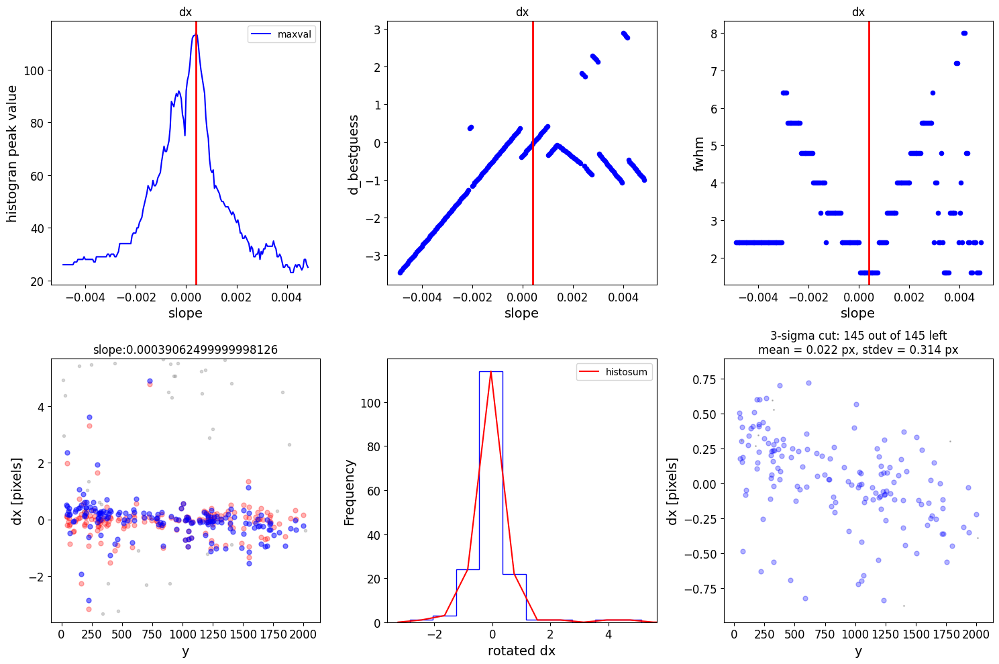

   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000146      -0.15   108.0      3    -0.042939   1.6     False
d_rot_tmp 0.7570610854132138
Keeping 136 out of 136, skippin 0 because of null values in columns d_rot_tmp
median: -0.095475
75.000000 percentile cut: max residual for cut: 0.333248
__tmp_residuals 0.33324760028206873
median: -0.090191
i:00 mean:-0.090191(0.016574) stdev:0.166570(0.011662) X2norm:1.00 Nchanged:0 Ngood:102 Nclip:34

mean: -0.105766
i:01 mean:-0.105766(0.020097) stdev:0.216452(0.014150) X2norm:1.00 Nchanged:15 Ngood:117 Nclip:19

mean: -0.117870
i:02 mean:-0.117870(0.022280) stdev:0.247093(0.015690) X2norm:1.00 Nchanged:7 Ngood:124 Nclip:12

mean: -0.123037
i:03 mean:-0.123037(0.024448) stdev:0.276594(0.017220) X2norm:1.00 Nchanged:5 Ngood:129 Nclip:7

mean: -0.093046
i:04 mean:-0.093046(0.027009) stdev:0.311478(0.019027) X2norm:1.00 Nchanged:5 Ngood:134 Nclip:2

mean: -0.080758
i:05 mean:-0.080758(0.027991) stdev:0.325228(0.019720) X2norm:1.00 

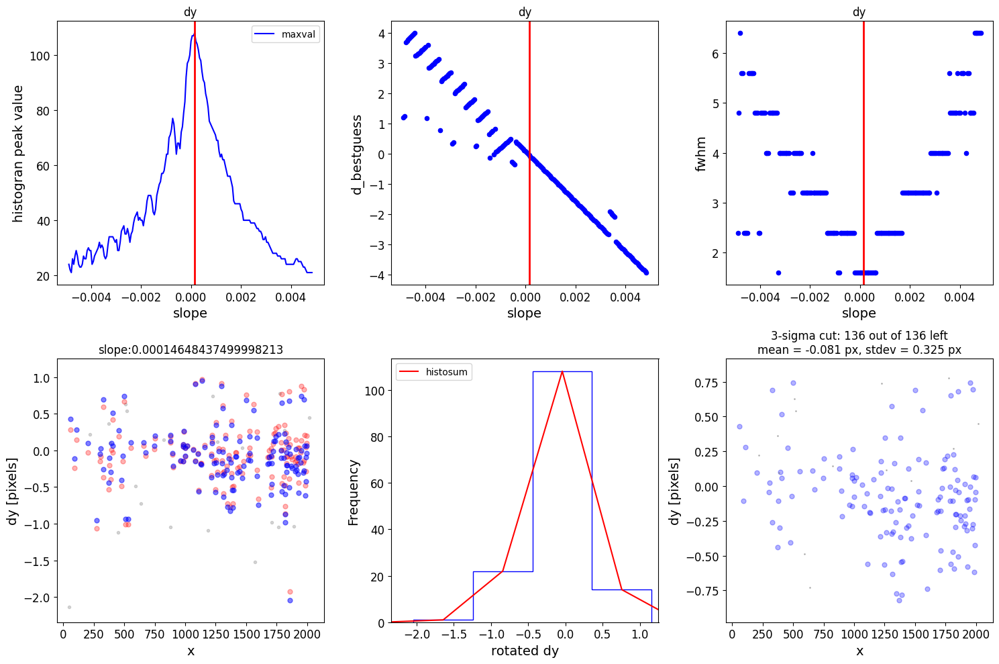

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2024-09-26 13:47:13,766 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2024-09-26 13:47:14,513 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2048, 2048) from jw01334001001_04101_00001_nrca4_cal.fits>],).
2024-09-26 13:47:14,519 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /home/aswin/hst123/jwstred_temp_gaia/jw01334001001_04101_00001_nrca4_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: rshift
  nclip: 3
  sigma: 3.0
  align_to_

replacing SIP ./jwstred_temp_gaia/jw01334001001_04101_00001_nrca4_jhat.fits


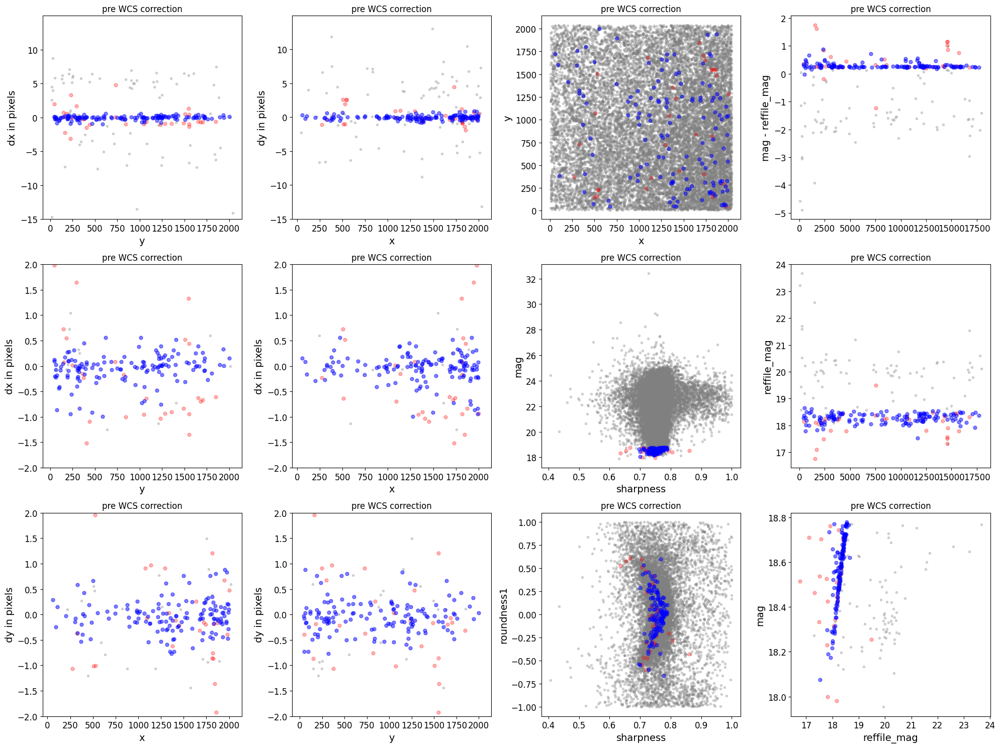

./jwstred_temp_gaia/jw01334001001_04101_00001_nrca4_jhat.fits


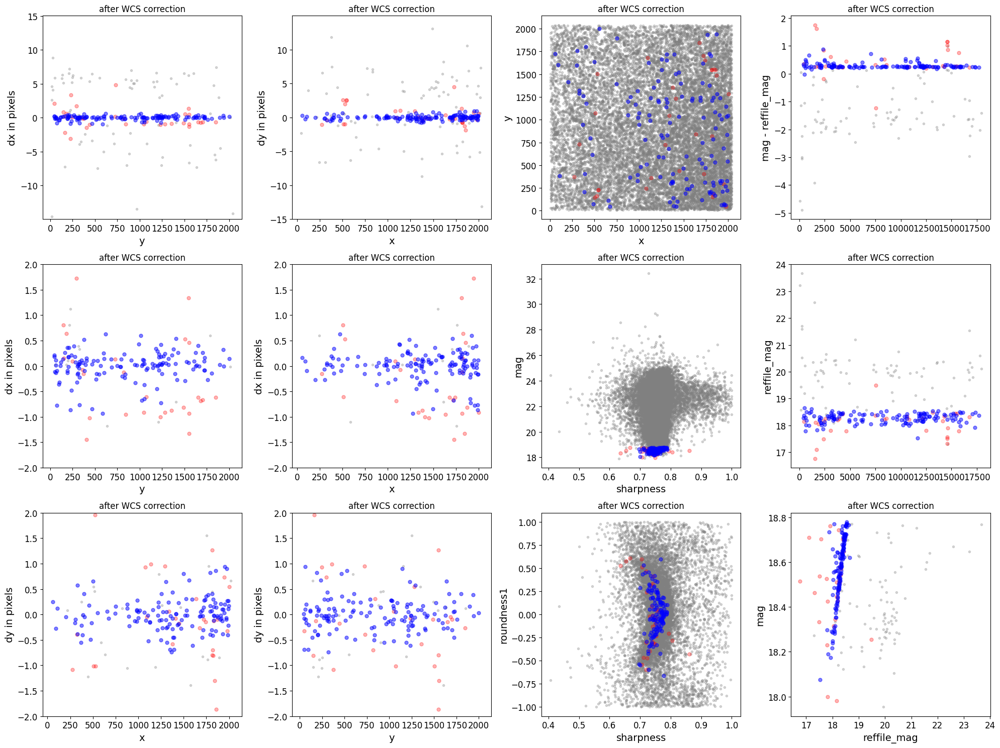

*** Note: close plots to continue!


0

In [66]:
wcs_align = st_wcs_align()


wcs_align.run_all(align_image,
          telescope='jwst',
          outsubdir='jwstred_temp_gaia',
          refcat_racol='ra',
          refcat_deccol='dec',
          refcat_magcol='mag',
          refcat_magerrcol='dmag',
          overwrite=True,
          d2d_max=.15,
          showplots=2,
          find_stars_threshold=5,
          refcatname=ref_catname,
          histocut_order='dxdy',
              sharpness_lim=(0.3,0.9),
              roundness1_lim=(-0.7, 0.7),
              SNR_min= 5,
              dmag_max=0.1,
              Nbright=250,
              objmag_lim =(14,21),
              binsize_px = 0.8,
              use_dq = True)

## Align to Catalog

You can also align each image to the Gaia DR3 catalog, or you
could replace the catalog created in step one with your own
catalog of the field. 



In [5]:
align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_cal.fits')[0] #short wavelength
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')[0] #long wavelength
# align_image = glob.glob('jwstred_temp_gaia/jw01783004005_02101_00001_nrcalong_cal.fits')[0]
# align_image = glob.glob('jwstred_temp_gaia/jw01334-o001_t001_nircam_clear-f277w_i2d.fits')[0] #level3 file
# align_image = glob.glob('jwstred_temp_mosaic/jw02784002001_02101_00001_nrcb1_cal.fits')[0]

In [8]:
# to plot regions in ds9
try:
    align_df = pd.read_csv(align_image.replace('.fits', '.phot_psf.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')
except:
    align_df = pd.read_csv(align_image.replace('_cal.fits', '.phot.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')    

In [9]:
_df = pd.read_csv('jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_cal_region.txt', sep = '\s+', header = None)
_df[0], _df[1] = _df[0]+1, _df[1]+1
np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), _df.values, fmt='%s')

telescope set to jwst

### Doing photometry on jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_cal.fits
True ./jwstred_temp_gaia/jw01334001001_02101_00001_nrca4.phot.txt
photometry catalog filename: ./jwstred_temp_gaia/jw01334001001_02101_00001_nrca4.phot.txt
photcat ./jwstred_temp_gaia/jw01334001001_02101_00001_nrca4.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCA4_FULL
Applying Pixel Area Map
Finding stars --- Detector: NRCA4, Filter: F090W
FWHM for the filter F090W: 1.103 px
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.7373621463775635 0.5657960341789743


2024-10-22 22:01:00,395 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-10-22 22:01:00,467 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-10-22 22:01:00,472 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-10-22 22:01:00,473 - stpipe - INFO - Instrument: NIRCAM
2024-10-22 22:01:00,473 - stpipe - INFO - Detector: NRCA4
2024-10-22 22:01:00,473 - stpipe - INFO - Filter: F090W
2024-10-22 22:01:00,473 - stpipe - INFO - Pupil: CLEAR
2024-10-22 22:01:00,473 - stpipe - INFO - Subarray: FULL
2024-10-22 22:01:00,483 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)



Number of sources found in the image: 20902
-------------------------------------

radii:[4.162]pixels radius_sky_in:7.480000019073486 radius_sky_out:9.25100040435791  radius_for_mag:[4.162]
Performing aperture photometry for radius r = 4.1620001792907715 px
Time Elapsed: 3.9175116659898777
20329 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 20187 objects left after removing entries dmag>0.2172 (SNR<5)
20187 out of 20329 entries remain in photometry table
Saving ./jwstred_temp_gaia/jw01334001001_02101_00001_nrca4.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 20329 objects
dmag_max =0.1 CUT:
dmag 0.1
19894 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
19261 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
17661 left
objmag_lim=(15, 22) CUT:
mag 22
7914 left
7914 of image photometry objects pass initial cuts #1, 12415 cut
Getting Gaia and matching it: ra=259.2617800995965 dec=43.12399616050981 radius=0

2024-10-22 22:01:10,412 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of stars: 2244
### NO propoer motion correction!!!
Number of stars after removing nan's: 2244
########### !!!!!!!!!!  INITIAL CUT on reference catalog: starting with 2244 objects
refmag_lim=(12, 19) CUT:
g 19
1627 left
1627 of image photometry objects pass initial cuts #1, 617 cut
Matching reference catalog Gaia
Using 7914 image objects that are in x_idl=[-31.38,31.58] and y_idl=[-31.58,31.41] range
x 2008
y 2008
Keeping 487 out of 2244 catalog objects within x=40.0-2008 and y=40.0-2008
Keeping 487  after removing NaNs from ra/dec
!! Matching 7914 image objects to 487 refcat objects!
Saving refcat file into ./jwstred_temp_gaia/jw01334001001_02101_00001_nrca4.refcat.txt
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 7914 objects
d2d =1.0 CUT using gaia_d2d:
gaia_d2d 1.0
3878 left
3878 of image photometry objects pass initial cuts #1, 4036 cut
dx median: -60.843456793759174
dy median: 12.309921111706899
*** Note:

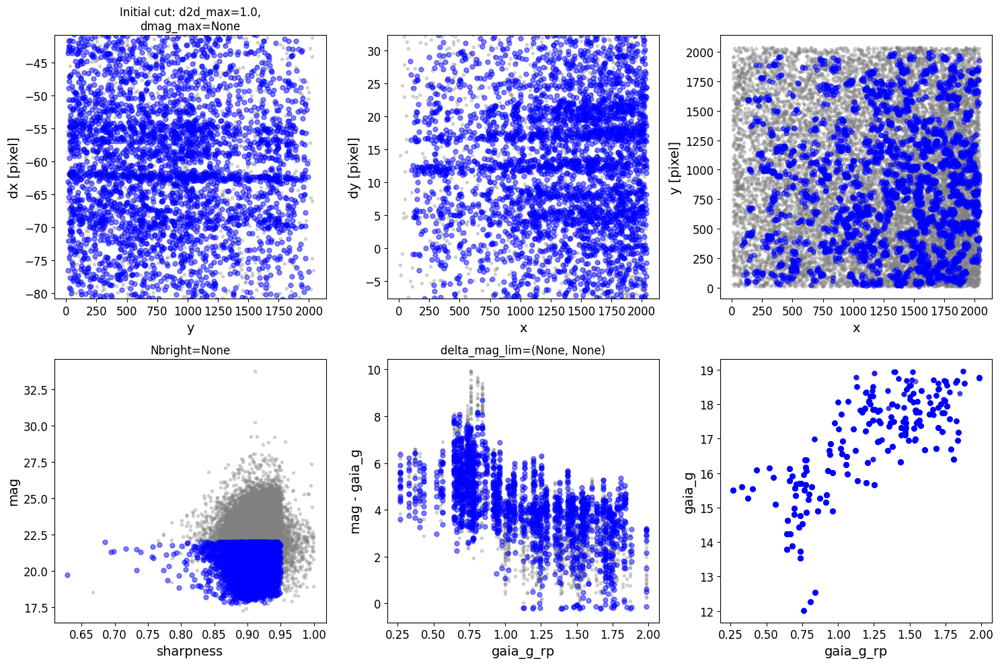

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000195        0.2   297.0     30   -62.451334   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -61.65133423664453

rough_cut_px=0.8 pixels removes 3499 from 3878 entries
Keeping 379 out of 379, skippin 0 because of null values in columns d_rot_tmp
median: -62.362464
75.000000 percentile cut: max residual for cut: 0.459620
__tmp_residuals 0.45961952029071895
median: -62.360242
i:00 mean:-62.360242(0.014037) stdev:0.236146(0.009908) X2norm:1.00 Nchanged:0 

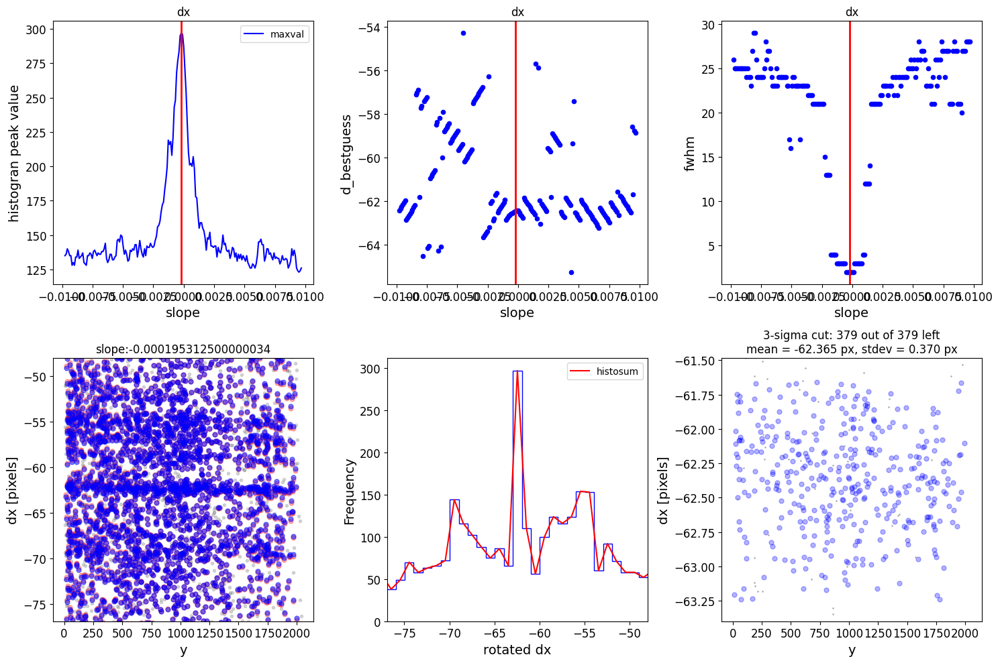

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000488       -0.5   121.0     33     12.35086   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 13.15086020985584

rough_cut_px=0.8 pixels removes 229 from 379 entries
Keeping 150 out of 150, skippin 0 because of null values in columns d_rot_tmp
median: 12.305870
75.000000 percentile cut: max residual for cut: 0.433332
__tmp_residuals 0.4333320716992386
median: 12.311746
i:00 mean:12.311746(0.022126) stdev:0.233110(0.015575) X2norm:1.00 Nchanged:0 Ngood:112

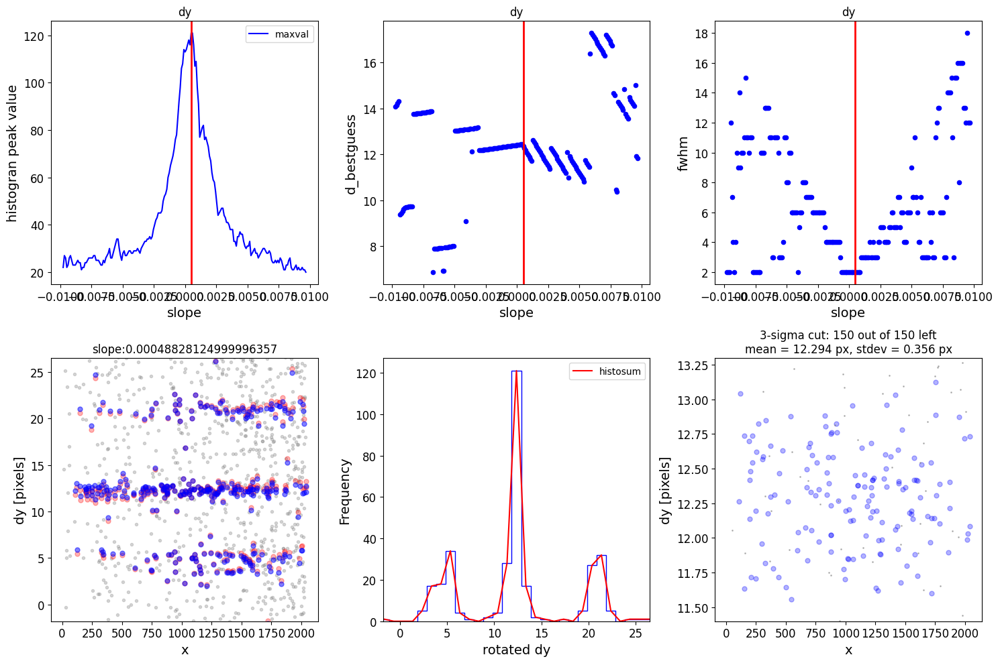

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: -62.39634928506928 dy median of best matched objects of 1st iteration: 12.321656136481124
Matching reference catalog Gaia
Using 7914 image objects that are in x_idl=[-31.38,31.58] and y_idl=[-31.58,31.41] range
x 2008
y 2008
Keeping 487 out of 2244 catalog objects within x=40.0-2008 and y=40.0-2008
Keeping 487  after removing NaNs from ra/dec
!! Matching 7914 image objects to 487 refcat objects!
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 7914 objects
d2d =1.0 CUT using gaia_d2d:
gaia_d2d 1.0
3894 left
3894 of image photometry objects pass initial cuts #1, 4020 cut
### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    

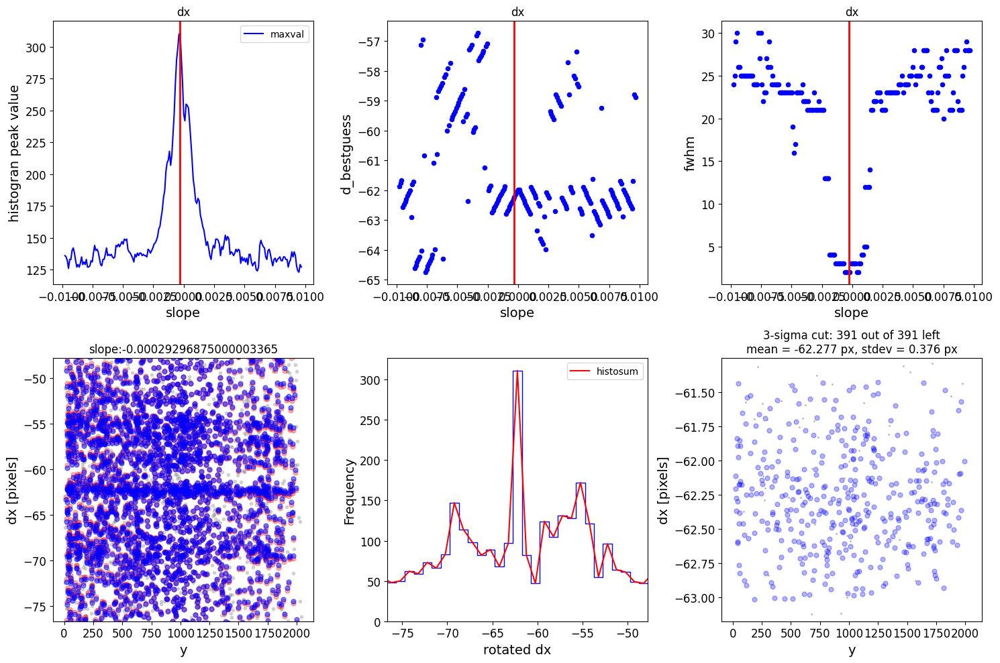

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000488       -0.5   124.0     33     12.35086   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 13.15086020985584

rough_cut_px=0.8 pixels removes 240 from 391 entries
Keeping 151 out of 151, skippin 0 because of null values in columns d_rot_tmp
median: 12.319895
75.000000 percentile cut: max residual for cut: 0.431857
__tmp_residuals 0.43185728325055095
median: 12.338864
i:00 mean:12.338864(0.021243) stdev:0.224812(0.014954) X2norm:1.00 Nchanged:0 Ngood:11

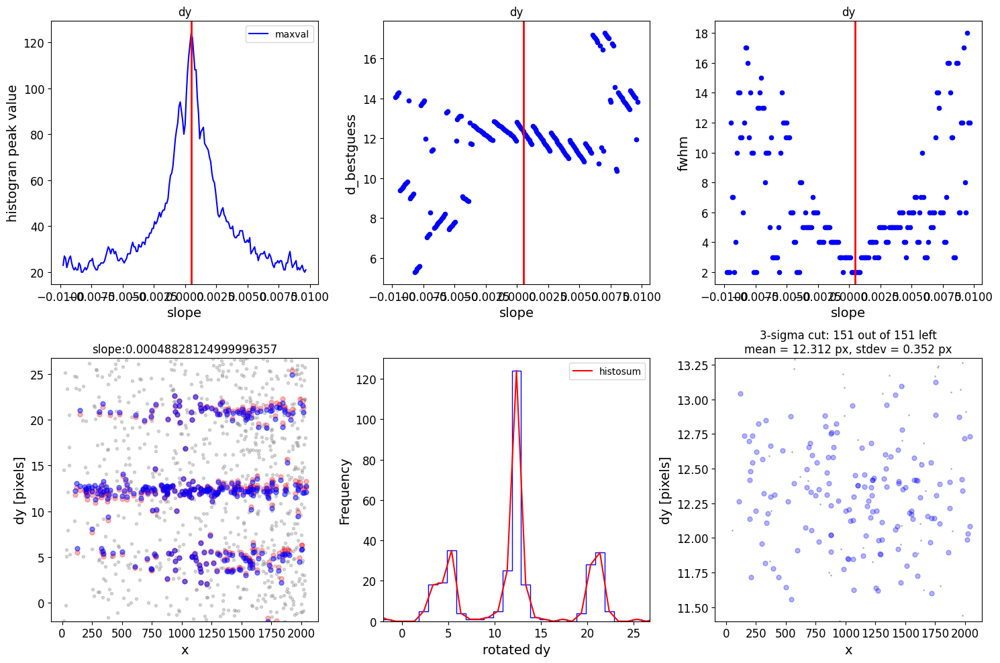

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2024-10-22 22:01:17,203 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2024-10-22 22:01:17,362 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(2048, 2048) from jw01334001001_02101_00001_nrca4_cal.fits>],).
2024-10-22 22:01:17,364 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: rshift
  nclip: 3
  sigma: 3.0
  align_t

Setting output directory for jw01334001001_02101_00001_nrca4_jhat.fits file to ./jwstred_temp_gaia
151 matches are passed to tweakreg rshift fitting
Fitting tweakreg fitgeometry=rshift to xy=x,y to ra,dec=gaia_ra,gaia_dec


2024-10-22 22:01:17,418 - stpipe.TweakRegStep - INFO - Aligning image catalog 'GROUP ID: jw01334001001_02101_00001_nrca4_cal' to the reference catalog.
2024-10-22 22:01:17,454 - stpipe.TweakRegStep - INFO - No matching of sources from 'GROUP ID: jw01334001001_02101_00001_nrca4_cal' catalog with sources from the reference 'Unnamed' catalog was requested.
2024-10-22 22:01:17,455 - stpipe.TweakRegStep - INFO - Catalogs are assumed matched with 1-to-1 correspondence.
2024-10-22 22:01:17,455 - stpipe.TweakRegStep - INFO - Found 151 matches for 'GROUP ID: jw01334001001_02101_00001_nrca4_cal'...
2024-10-22 22:01:17,456 - stpipe.TweakRegStep - INFO - Performing 'rshift' fit
2024-10-22 22:01:17,457 - stpipe.TweakRegStep - INFO - Computed 'rshift' fit for GROUP ID: jw01334001001_02101_00001_nrca4_cal:
2024-10-22 22:01:17,457 - stpipe.TweakRegStep - INFO - XSH: -1.82832  YSH: -0.709482    ROT: 0.00276569    SCALE: 1
2024-10-22 22:01:17,457 - stpipe.TweakRegStep - INFO - 
2024-10-22 22:01:17,457 -

replacing SIP ./jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_jhat.fits


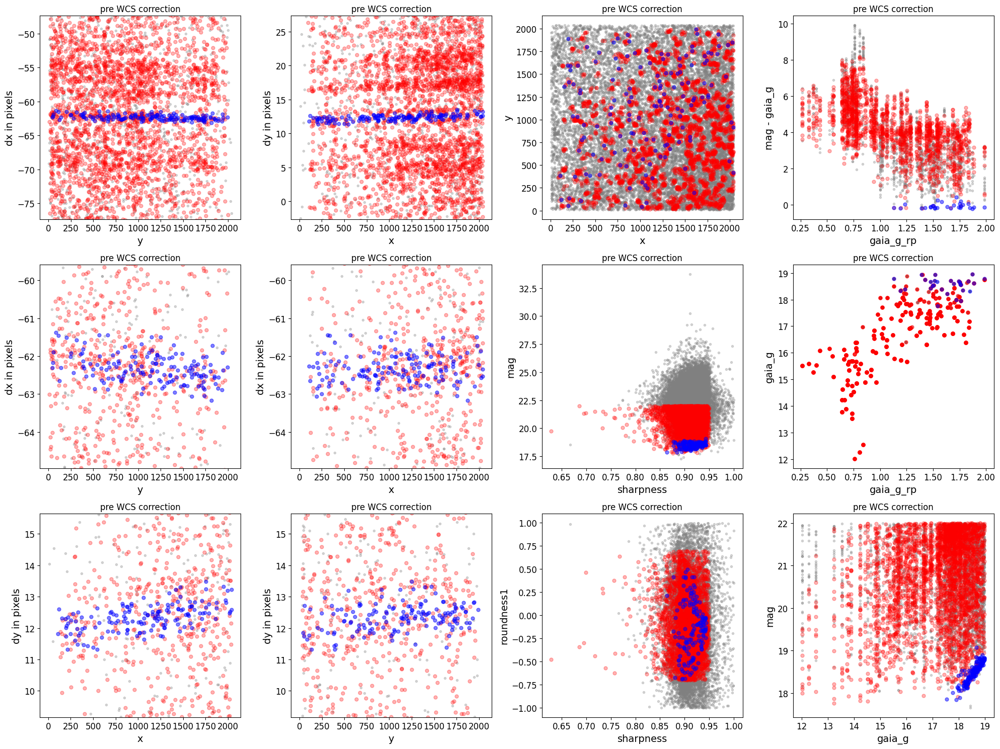

./jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_jhat.fits
Saving ./jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_jhat.good.phot.txt
Saving ./jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_jhat.all.phot.txt


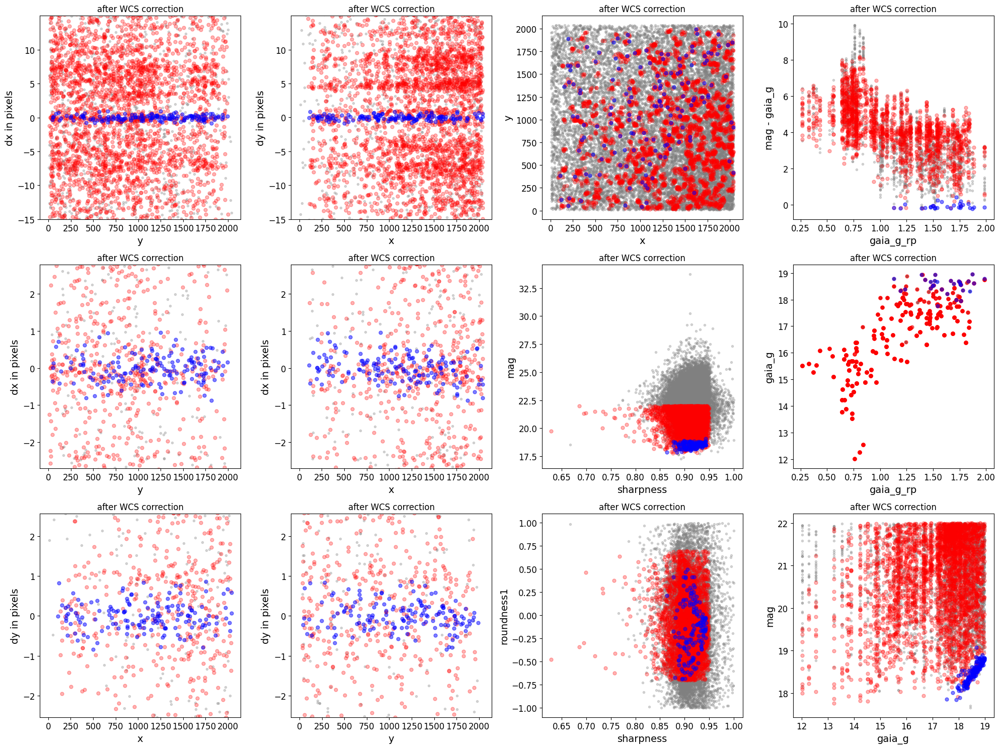

*** Note: close plots to continue!


0

In [7]:
wcs_align = st_wcs_align()
    
wcs_align.run_all(align_image,
          telescope='jwst',
          outsubdir='jwstred_temp_gaia',
          overwrite=True,
          d2d_max=1.0, 
          find_stars_threshold = 3,
          showplots=2,
          refcatname='Gaia',
          refcat_pmflag = True,
          histocut_order='dxdy',
          use_dq = False,
          verbose = True,
          iterate_with_xyshifts = True,
          xshift = -60,
          yshift = 10,
              sharpness_lim=(0.3,0.95),
              roundness1_lim=(-0.7, 0.7),
#               Nbright = 1000,
              SNR_min= 5,
              dmag_max=.1,
              objmag_lim =(15,22),
              refmag_lim = (12,19),
              binsize_px = 1.0,
              saveplots = 0,
              slope_min = -20/2048,
              savephottable = 3)

#### Create ds9 region files

In [38]:
source_df = pd.read_csv('good_sources.csv')
np.savetxt('good_locs.txt', source_df[['x', 'y']].values, fmt = '%s')
np.savetxt('gaia_locs.txt', source_df[['gaia_x', 'gaia_y']].values, fmt = '%s')
np.savetxt('gaiaradec.txt', source_df[['gaia_ra', 'gaia_dec']].values, fmt = '%s')
np.savetxt('jwstradec.txt', source_df[['ra', 'dec']].values, fmt = '%s')

In [39]:
source_df.columns

Index(['aper_sum_4.2px', 'annulus_median_4.2px', 'aper_bkg_4.2px',
       'aper_sum_bkgsub_4.2px', 'flux_err_4.2px', 'mag', 'dmag', 'x', 'y',
       'sharpness', 'roundness1', 'roundness2', 'ra', 'dec', 'x_idl', 'y_idl',
       'gaia_ra', 'gaia_dec', 'gaia_ID', 'gaia_g', 'gaia_g_err', 'gaia_g_rp',
       'gaia_SOURCE_ID', 'gaia_ra_error', 'gaia_dec_error', 'gaia_rp',
       'gaia_rp_err', 'gaia_g_rp_err', 'delta_mag', '__weights', 'd_rot_tmp',
       '__tmp_residuals', 'gaia_x', 'gaia_y', 'dx', 'dy'],
      dtype='object')

Text(0, 0.5, 'gaia mag')

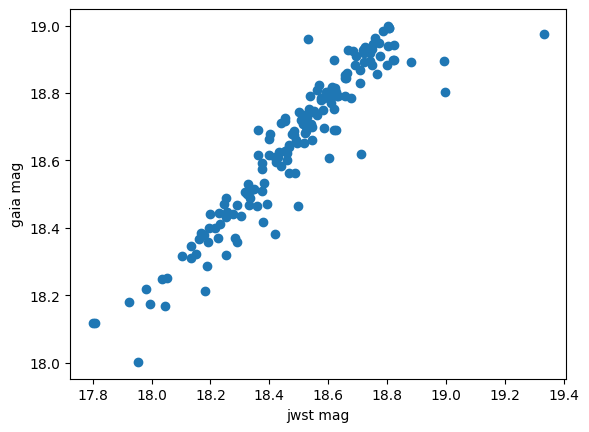

In [40]:
plt.scatter(source_df['mag'], source_df['gaia_g'])
plt.xlabel('jwst mag')
# plt.xlabel('color (jwst - gaia)')
plt.ylabel('gaia mag')
# plt.xlim(16, 25)
# plt.ylim(16,25)

In [23]:
# to plot regions in ds9
try:
    align_df = pd.read_csv(align_image.replace('.fits', '.phot_psf.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')
except:
    align_df = pd.read_csv(align_image.replace('_cal.fits', '.phot.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')    

#### Gaia xmatch

In [8]:
def cut_gaia_sources(image, table_gaia):
    im = fits.open(image)
    hdr = im['SCI'].header
    w = wcs.WCS(hdr)
    nx, ny = hdr['NAXIS1'], hdr['NAXIS2']

    pix_coords = w.all_world2pix(np.array(table_gaia['ra']), np.array(table_gaia['dec']), 1)
    im_x, im_y = pix_coords[0], pix_coords[1]
    mask = (im_x > 0) & (im_x < nx) & (im_y > 0) & (im_y < ny)

    return table_gaia[mask]

In [9]:
def query_gaia(image, dr = 'gaiadr3', save_file = False):
    im = fits.open(image)

    hdr = im['SCI'].header
    nx = hdr['NAXIS1']
    ny = hdr['NAXIS2']

    image_model = ImageModel(im)
    
    #find radius of query region usinng image header
    ra0,dec0 = image_model.meta.wcs(nx/2.0-1,ny/2.0-1)
    coord0 = SkyCoord(ra0,dec0,unit=(u.deg, u.deg), frame='icrs')
    radius_deg = []
    for x in [0,nx-1]:        
        for y in [0,ny-1]:     
            ra,dec = image_model.meta.wcs(x,y)
            radius_deg.append(coord0.separation(SkyCoord(ra,dec,unit=(u.deg, u.deg), frame='icrs')).deg)
    radius_deg = np.amax(radius_deg)*1.1

    #query gaia
    query ="SELECT * FROM {}.gaia_source WHERE CONTAINS(POINT('ICRS',\
            {}.gaia_source.ra,{}.gaia_source.dec),\
            CIRCLE('ICRS',{},{} ,{}))=1;".format(dr,dr,dr,ra0,dec0,radius_deg)

    job5 = Gaia.launch_job_async(query)
    tb_gaia = job5.get_results() 
    tb_gaia = cut_gaia_sources(image, tb_gaia)
    print("Number of Gaia stars:",len(tb_gaia))
    
    if save_file:
        print(f'Saving Gaia query to {save_file}')
        np.savetxt(save_file, np.array(tb_gaia[['ra', 'dec']]), fmt = '%s')
    
    return tb_gaia

In [10]:
tb_gaia = query_gaia('jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_jhat.fits', save_file = 'all_gaia_locs.txt')

2024-10-22 22:06:44,783 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 755
Saving Gaia query to all_gaia_locs.txt


In [11]:
tb_gaia

solution_id,DESIGNATION,SOURCE_ID,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pm,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,nu_eff_used_in_astrometry,pseudocolour,pseudocolour_error,ra_pseudocolour_corr,dec_pseudocolour_corr,parallax_pseudocolour_corr,pmra_pseudocolour_corr,pmdec_pseudocolour_corr,astrometric_matched_transits,visibility_periods_used,astrometric_sigma5d_max,matched_transits,new_matched_transits,matched_transits_removed,ipd_gof_harmonic_amplitude,ipd_gof_harmonic_phase,ipd_frac_multi_peak,ipd_frac_odd_win,ruwe,scan_direction_strength_k1,scan_direction_strength_k2,scan_direction_strength_k3,scan_direction_strength_k4,scan_direction_mean_k1,scan_direction_mean_k2,scan_direction_mean_k3,scan_direction_mean_k4,duplicated_source,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_flux_over_error,phot_g_mean_mag,phot_bp_n_obs,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_flux_over_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_bp_n_contaminated_transits,phot_bp_n_blended_transits,phot_rp_n_contaminated_transits,phot_rp_n_blended_transits,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_method_used,rv_nb_transits,rv_nb_deblended_transits,rv_visibility_periods_used,rv_expected_sig_to_noise,rv_renormalised_gof,rv_chisq_pvalue,rv_time_duration,rv_amplitude_robust,rv_template_teff,rv_template_logg,rv_template_fe_h,rv_atm_param_origin,vbroad,vbroad_error,vbroad_nb_transits,grvs_mag,grvs_mag_error,grvs_mag_nb_transits,rvs_spec_sig_to_noise,phot_variable_flag,l,b,ecl_lon,ecl_lat,in_qso_candidates,in_galaxy_candidates,non_single_star,has_xp_continuous,has_xp_sampled,has_rvs,has_epoch_photometry,has_epoch_rv,has_mcmc_gspphot,has_mcmc_msc,in_andromeda_survey,classprob_dsc_combmod_quasar,classprob_dsc_combmod_galaxy,classprob_dsc_combmod_star,teff_gspphot,teff_gspphot_lower,teff_gspphot_upper,logg_gspphot,logg_gspphot_lower,logg_gspphot_upper,mh_gspphot,mh_gspphot_lower,mh_gspphot_upper,distance_gspphot,distance_gspphot_lower,distance_gspphot_upper,azero_gspphot,azero_gspphot_lower,azero_gspphot_upper,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,ebpminrp_gspphot,ebpminrp_gspphot_lower,ebpminrp_gspphot_upper,libname_gspphot
,,,,yr,deg,mas,deg,mas,mas,mas,,mas / yr,mas / yr,mas / yr,mas / yr,mas / yr,,,,,,,,,,,,,,,,,mas,,,,1 / um,1 / um,1 / um,,,,,,,,mas,,,,,deg,,,,,,,,deg,deg,deg,deg,,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,,,,,,mag,mag,mag,km / s,km / s,,,,,,,,d,km / s,K,log(cm.s**-2),dex,,km / s,km / s,,mag,mag,,,,deg,deg,deg,deg,,,,,,,,,,,,,,,K,K,K,log(cm.s**-2),log(cm.s**-2),log(cm.s**-2),dex,dex,dex,pc,pc,pc,mag,mag,mag,mag,mag,mag,mag,mag,mag,
int64,object,int64,int64,float64,float64,float32,float64,float32,float64,float32,float32,float32,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,int16,bool,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,float32,int16,int16,int16,float32,float32,int16,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,bool,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,float32,int16,int16,int16,int16,int16,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,float32,float32,float32,float32,

In [64]:
def calc_dispersion(gaia_table, phot_file, dist_limit = 1, plot = False, inspect_large_offset = False):
    jhat_df = pd.read_csv(glob.glob(phot_file)[0], sep = '\s+') #read phot file with uneven spacing
    
    jh_ra, jh_dec = jhat_df['ra'].to_numpy()*u.degree, jhat_df['dec'].to_numpy()*u.degree
    jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)
    ga_ra, ga_dec = np.array(gaia_table['ra'])*u.degree, np.array(gaia_table['dec'])*u.degree
    ga_skycoord = SkyCoord(ra = ga_ra, dec = ga_dec)
    
    dist_matched_df = xmatch_common(jh_skycoord, ga_skycoord, dist_limit=dist_limit)
    if inspect_large_offset:
        dmask = dist_matched_df['d2d'] > 0.1
        np.savetxt('jwstred_temp_gaia/jwst_large_offset.txt', np.column_stack((np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].ra.degree),
                       np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].dec.degree))), fmt='%s', delimiter = ',')
        np.savetxt('jwstred_temp_gaia/gaia_large_offset.txt', np.column_stack((np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].ra.degree),
                       np.array(ga_skycoord[dist_matched_df[dmask]['idx_2']].dec.degree))), fmt='%s', delimiter = ',')

    clip_mean, clip_median, clip_std = sigma_clipped_stats(dist_matched_df['d2d']**2)
    print(clip_mean, clip_median, clip_std)
    dispersion = np.sqrt(clip_mean)
    
    if plot:
        plt.hist(dist_matched_df['d2d'], bins = 40, histtype = 'step', 
                 linestyle = '--', color = 'cornflowerblue')
        plt.xlabel('d2d (arcsec)')
        plt.ylabel('frequency')
        plt.title('JWST-Gaia xmatch')
        plt.grid(alpha = 0.2, linestyle = '--')
        plt.show()
        
    return dispersion

0.014628105316009535 0.012574586814283948 0.007454688537882635


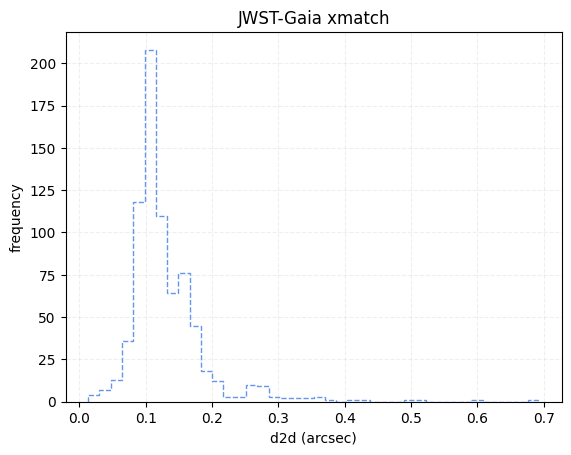

0.12094670444460046

In [13]:
calc_dispersion(tb_gaia, align_image.replace('_cal.fits', '.phot.txt'), plot = True)

In [14]:
jwst_phot = jwst_photclass()
phot_img = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_jhat_cal.fits')[0]
jwst_phot.run_phot(imagename=phot_img,
                   photfilename='jwstred_temp_gaia/jhat_corr_phot.txt',
                   overwrite=True,
                   ee_radius=70,
#                    use_dq=True,
                   SNR_min = 10,
                   find_stars_threshold = 5)
# ref_catname = ref_image.replace('.fits','.phot.txt') # the default
refcat = Table.read('jwstred_temp_gaia/jhat_corr_phot.txt',format='ascii')
print(refcat)

0 jwstred_temp_gaia/jhat_corr_phot.txt


2024-10-22 22:21:26,132 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-10-22 22:21:26,268 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-10-22 22:21:26,273 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-10-22 22:21:26,273 - stpipe - INFO - Instrument: NIRCAM
2024-10-22 22:21:26,274 - stpipe - INFO - Detector: NRCA4
2024-10-22 22:21:26,274 - stpipe - INFO - Filter: F090W
2024-10-22 22:21:26,274 - stpipe - INFO - Pupil: CLEAR
2024-10-22 22:21:26,274 - stpipe - INFO - Subarray: FULL
2024-10-22 22:21:26,284 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.1086
aper_sum_4.2px annulus_median_4.2px aper_bkg_4.2px ...   x_idl      y_idl   
-------------- -------------------- -------------- ... ---------- ----------
   1120.684357             1.445329      78.653971 ... -18.643959 -31.473312
     98.938598             1.364692      74.265759 ...  -15.31883 -31.419365
     684.55877             1.521235      82.784736 ...  -6.312187 -31.519364
     338.87155             2.993575     162.908691 ...   7.933129 -31.537068
    269.321311             3.351092     182.364572 ...  10.494819  -31.56785
    255.404354             3.634204     197.771326 ...  13.861517 -31.539625
   1022.168736             4.759752     259.023036 ...  16.211523 -31.581025
    460.676999             6.867782     373.740851 ...    23.5698 -31.528641
    373.876921             4.554184     247.836163 ...  30.066456 -31.555231
   1022.802369             1.206302      65.646268 ... -25.300494 -31.357506
           ...                  ...            ... ...        ..

0.01713093439911459 0.0007414167933373939 0.022302840566942622


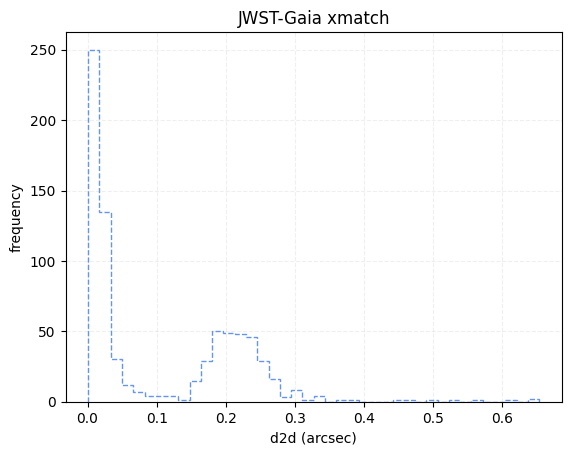

0.13088519549251776

In [67]:
calc_dispersion(tb_gaia, 'jwstred_temp_gaia/jhat_corr_phot.txt', dist_limit = 1.0, plot = True, inspect_large_offset=True)

In [32]:
# np.savetxt('corrected_coords.txt', refcat[['ra', 'dec']].to_pandas().values, fmt='%s')    
np.savetxt('corrected_coords_gaia.txt', tb_gaia[['ra', 'dec']].to_pandas().values, fmt='%s')    

#### Breakup star mask

In [18]:
jwst_im = fits.open(glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')[0])

In [19]:
jwst_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [20]:
dq_mask = deepcopy(jwst_im['DQ'].data)

In [21]:
flag_sat = np.array(dq_mask != 1) & np.array(dq_mask != 2) & np.array(dq_mask != 3)

In [22]:
np.shape(flag_sat), np.shape(dq_mask)

((2048, 2048), (2048, 2048))

In [23]:
flag_sat.sum()

4165548

In [24]:
dq_mask[flag_sat] = 10
dq_mask[~flag_sat] = 1

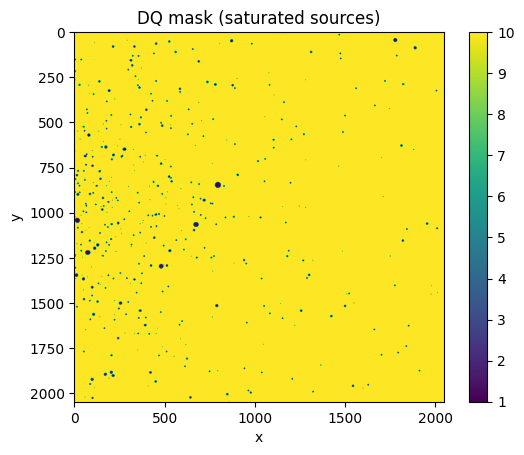

In [26]:
plt.imshow(dq_mask)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.title('DQ mask (saturated sources)')
plt.show()
# plt.savefig('dq_mask.png', bbox_inches = 'tight', dpi = 500)

In [27]:
np.unique(dq_mask)

array([ 1, 10], dtype=uint32)

In [36]:
def expand_mask(mask, size = 40, mask_shape = 'square'):
    """
    Expand the mask by a given size using binary dilation.

    Parameters
    ----------
    mask : numpy.ndarray
        The mask to be expanded.
    size : int
        The size of the structuring element used for binary dilation.
    mask_shape : str
        The shape of the structuring element. Can be 'square' or 'circle'.

    Returns
    -------
    mask_exp : numpy.ndarray
        The expanded mask.
    """
    # Create a binary mask where pixels with flag 1 are set to True
    binary_mask = (mask == 1)
    
    # Define a structuring element
    if mask_shape == 'square':
        structuring_element = np.ones((size, size), dtype=bool)
    if mask_shape == 'circle':
        y, x = np.ogrid[:size, :size]
        center = (size-1)/2
        structuring_element = (x - center)**2 + (y - center)**2 <= center**2
    
    expanded_mask = binary_dilation(binary_mask, structure=structuring_element)
    
    # Convert the expanded binary mask back to the original mask format
    mask_exp = np.where(expanded_mask, 1, mask)
    
    return mask_exp

In [41]:
expmask = expand_mask(dq_mask, mask_shape = 'circle')
expmask[expmask == 1] = False
expmask[expmask == 10] = True
# expmask[expmask == 1] = True

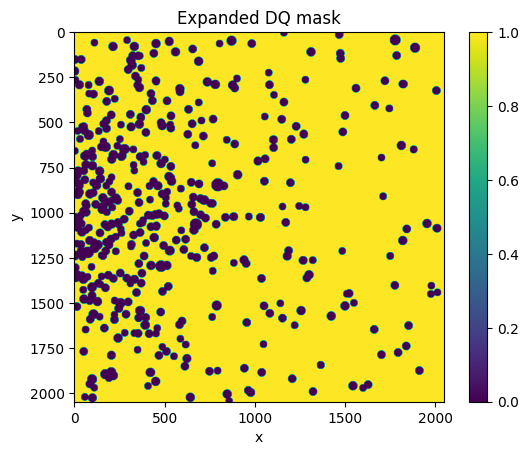

In [42]:
# expmask[expmask > 10] = 10
plt.imshow(expmask)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Expanded DQ mask')
plt.show()
# plt.savefig('exp_dq_mask.png', bbox_inches = 'tight', dpi = 500)

In [43]:
expmask

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint32)

In [17]:
plt.imshow(jwst_im['SCI'].data, vmin = np.nanmedian(jwst_im['SCI'].data) - 1*np.nanstd(jwst_im['SCI'].data),
                                vmax = np.nanmedian(jwst_im['SCI'].data) + 1*np.nanstd(jwst_im['SCI'].data))
plt.colorbar()

In [307]:
# masked_im = np.where(dq_mask, jwst_im['SCI'].data, 3)
masked_im = np.where(expmask, jwst_im['SCI'].data, np.nan)

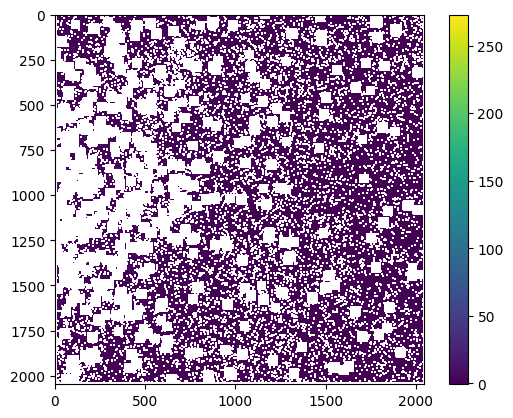

In [308]:
plt.imshow(masked_im)
plt.colorbar()

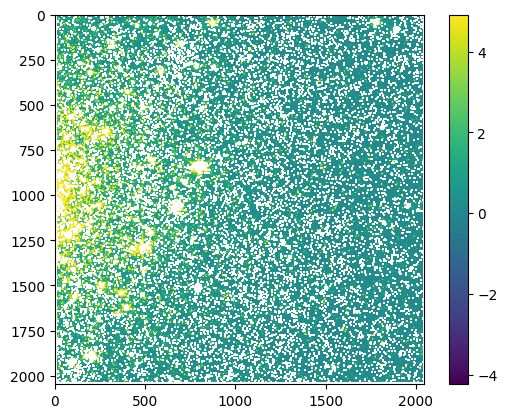

In [38]:
plt.imshow(masked_im, vmin = np.nanmedian(masked_im) - 1*np.nanstd(masked_im),
                      vmax = np.nanmedian(masked_im) + 1*np.nanstd(masked_im))
plt.colorbar()

In [309]:
jwst_im['SCI'].data = masked_im

In [44]:
# bin_dq_hdu = 
data, hdr = fits.getdata('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits', ext=3, header=True)
# bin_dq_data = np.where(expmask, jwst_im['DQ'].data, 3)
hdr['extname'] = 'BIN_DQ'
image_hdu = fits.ImageHDU(data=expmask, name="BIN_DQ", header = hdr)
jwst_im.insert(8, image_hdu)
# bin_dq_hdu

In [45]:
jwst_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   uint32   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  BIN_DQ        1 ImageHDU        11   (2048, 2048)   uint32   
  9  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [46]:
jwst_im.writeto('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal_masked.fits', overwrite = True)

In [48]:
def add_bin_dq(filename):
    im = fits.open(filename)
    dq_mask = deepcopy(im['DQ'].data)

    flag_sat = np.array(dq_mask != 1) & np.array(dq_mask != 2) & np.array(dq_mask != 3)
    dq_mask[flag_sat] = 10
    dq_mask[~flag_sat] = 1

    expmask = expand_mask(dq_mask, mask_shape = 'circle')
    expmask[expmask == 10] = False
    expmask[expmask == 1] = True

    data, hdr = fits.getdata(filename, ext=3, header=True)
    hdr['extname'] = 'BIN_DQ'
    image_hdu = fits.ImageHDU(data=expmask, name="BIN_DQ", header = hdr)
    im.insert(8, image_hdu)
    im.writeto(filename.replace('.fits', '_masked.fits'), overwrite = True)


In [49]:
add_bin_dq('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')

In [51]:
im = fits.open('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal_masked.fits')

In [58]:
:if im['BIN_DQ']

SyntaxError: invalid syntax (1305497275.py, line 1)

In [ ]:
def prepare_image(data_original, imhdr, area=None, dq=None, 
                  DNunits=False, dq_ignore_bits = 4):
    # dq_ignore_bits contains the bits in the dq which are still ok, so they
    # should be ignored.
    # 2 = Pixel saturated during integration
    # 4 = Jump detected during integration

    if area is not None:

        if self.verbose: print('Applying Pixel Area Map')

        data_pam = data_original * area

    else:

        data_pam = data_original

    if DNunits:
        if imhdr["BUNIT"]!='MJy/sr':
            raise RuntimeError(f'imhdr["BUNIT"]={imhdr["BUNIT"]} is not MJy/sr!')
        if self.verbose: print(f'Converting units from {imhdr["BUNIT"]} to DN/s')
        data = data_pam / imhdr['PHOTMJSR']
    else:
        data = data_pam


    if dq is not None:
        # dq_ignore_bits are removed from the mask!
        #fits.writeto('TEST_dq_delme.fits',dq,overwrite=True,output_verify='ignore')
        mask = np.bitwise_and(dq,np.full(data_original.shape, ~dq_ignore_bits, dtype='int'))
    else:
        mask = np.zeros(data_original.shape, dtype='int')

    # hijack a few bits for our purposes...
    mask[np.isnan(data)==True] = 8
    mask[np.isfinite(data)==False] = 8
    mask[np.where(data==0)] = 16

    #fits.writeto('TEST_mask_delme.fits',mask,overwrite=True,output_verify='ignore')

    data[mask>0] = np.nan

    return data,mask,DNunits

In [19]:
test_im = fits.open('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')

In [20]:
test_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  BIN_DQ        1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  9  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [23]:
data_original, imhdr = test_im['SCI'].data, test_im['SCI'].header
area = test_im['AREA'].data
dq = test_im['BIN_DQ'].data
dq_ignore_bits = 4
DNunits = False

if area is not None:

#     if self.verbose: print('Applying Pixel Area Map')

    data_pam = data_original * area

else:

    data_pam = data_original

if DNunits:
    if imhdr["BUNIT"]!='MJy/sr':
        print('no')
#         raise RuntimeError(f'imhdr["BUNIT"]={imhdr["BUNIT"]} is not MJy/sr!')
#     if self.verbose: print(f'Converting units from {imhdr["BUNIT"]} to DN/s')
    data = data_pam / imhdr['PHOTMJSR']
else:
    data = data_pam


if dq is not None:
    # dq_ignore_bits are removed from the mask!
    #fits.writeto('TEST_dq_delme.fits',dq,overwrite=True,output_verify='ignore')
    mask = np.bitwise_and(dq,np.full(data_original.shape, ~dq_ignore_bits, dtype='int'))
else:
    mask = np.zeros(data_original.shape, dtype='int')

# hijack a few bits for our purposes...
mask[np.isnan(data)==True] = 8
mask[np.isfinite(data)==False] = 8
mask[np.where(data==0)] = 16

#fits.writeto('TEST_mask_delme.fits',mask,overwrite=True,output_verify='ignore')

data[mask>0] = np.nan

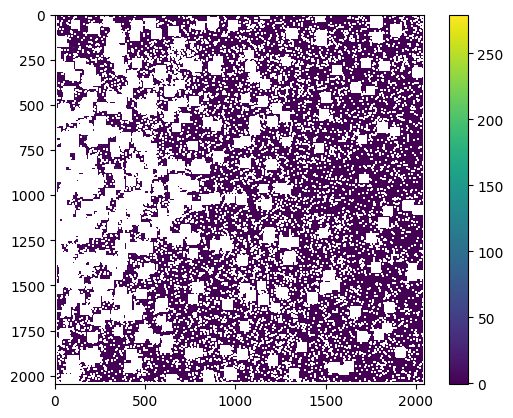

In [24]:
plt.imshow(data)
plt.colorbar()

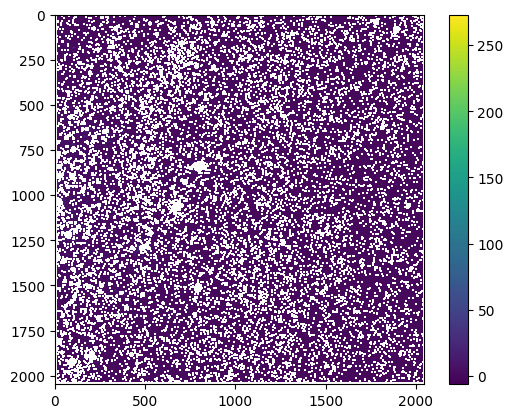

In [15]:
plt.imshow(test_im['SCI'].data)
plt.colorbar()

In [275]:
dq = test_im['BIN_DQ'].data
og_data = np.array(test_im['SCI'].data)
dq_ignore_bits = 4
mask = np.bitwise_and(dq, np.full(og_data.shape, ~dq_ignore_bits, dtype = 'int'))

In [247]:
dq

array([[2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       ...,
       [2155347969, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665]], dtype=uint32)

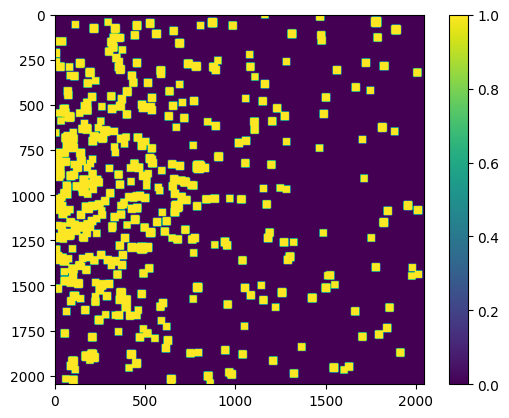

In [276]:
# mask = np.array(mask, dtype = 'float32')
# mask[mask>0] = np.nan
plt.imshow(mask)
plt.colorbar()

In [148]:
np.bitwise_and(np.array([1]), np.array([5]))

array([1])

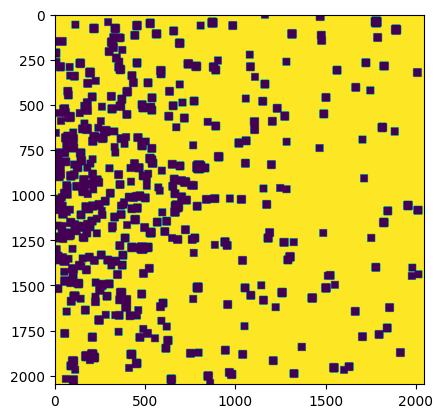

In [142]:
plt.imshow(dq)